# EE5175 Lab 3 : Image Mosaicing
Author: Kishore Rajendran [EE20B064]

Date: 20 Feb 2024

NOTE: Please run the code using an older version of OpenCV which supports xfeatures2d 

I'm using a conda environment with Python 3.6.13 and OpenCV 3.3.0

In [51]:
# Importing required libraries
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sift import sift as sift_corresp

Calculating the Homography matrix H given a set of point correspondences
 - Construct the A matrix (8x9) as derived in class using 4 input point correspondences
 - Pick the last column of matrix V obtained from the Singular Value Decomposition of A and reshape it to get Homography matrix H (3x3)

In [52]:
# Given 4 point correspondences between 2 images, Find the Homography matrix H (ie. The 8 unknowns of H)
def calculate_homography(corr1, corr2):
    # Constructing matrix A
    A = np.zeros((2*corr1.shape[0], 9))
    for i in range(corr1.shape[0]):
        A[2*i] = np.array([-corr1[i,0], -corr1[i,1], -1, 0, 0, 0, corr1[i,0]*corr2[i,0], corr1[i,1]*corr2[i,0], corr2[i,0]])
        A[2*i+1] = np.array([0, 0, 0, -corr1[i,0], -corr1[i,1], -1, corr1[i,0]*corr2[i,1], corr1[i,1]*corr2[i,1], corr2[i,1]])
    # Finding nullspace of A using SVD
    _, _, vt = np.linalg.svd(A)
    # Picking the last column of V obtained from SVD
    h = vt.T[:, -1]
    # Rearranging the column vector to give the H matrix
    H = np.reshape(h, (3,3))
    return H

Implementing the RANSAC algorithm
 - Pick 4 point correspondences randomly from the given set and calculate H
 - Check if this H matrix holds for more than $\texttt{thresh}$ percentage of the remaining point correspondences, with an error bound of $\texttt{epsilon}$
 - If true, return H, Otherwise repeat the process a maximum of $\texttt{max\_iter}$ number of times

In [53]:
def RANSAC(corr1, corr2, epsilon, thresh, max_iter):
    iter = 0
    while iter < max_iter:
        iter += 1
        # First pick 4 random correspondences and calculate H
        ids = np.random.randint(corr1.shape[0], size=4)
        H = calculate_homography(corr1[ids,:], corr2[ids, :])
        # Now check H for rest of the points
        rem_ids = np.setdiff1d(np.arange(corr1.shape[0]) , ids)
        consensus_set = 0
        # For all the remaining point correspondences
        for i in rem_ids:
            a = np.matmul(H, np.append(corr1[i,:], 1))
            a /= a[2]
            b = corr2[i, :]
            # Checking if error is less than epsilon
            if np.sqrt((a[0]-b[0])**2 + (a[1]-b[1])**2) < epsilon:
                consensus_set += 1
            # If the consensus set is greater than thresh percent of points, return H
        if consensus_set > thresh*(corr1.shape[0]-4):
            return H
        else:
            return RANSAC(corr1, corr2, epsilon, thresh, max_iter)
    else:
        print("Couldn't meet RANSAC threshold requirement\n")
        return H

Using the 2 above defined functions, Computing the Homography H between 2 images
 - Finding point correspondences between 2 given images using the $\texttt{SIFT}$ algorithm
 - Using the $\texttt{RANSAC}$ algorithm to get rid of outliers

In [54]:
def compute_homography(img1, img2):
    # Obtaining SIFT correspondences between the 2 images
    [corresp1, corresp2] = sift_corresp(img1,img2)
    # Using the RANSAC algorithm to get rid of outliers (wrong matches) and obtaining the Homography matrix H
    H = RANSAC(corresp1, corresp2, 10, 0.8, 50)
    return H

Bilinear Interpolation

In [55]:
# Given the transformed source image pixel coordinates and the image, apply bilinear interpolation to return correct target intensity
def bilinear_interpolation(xs, ys, img):
    xs_i = np.floor(xs)
    ys_i = np.floor(ys)
    a = xs - xs_i
    b = ys - ys_i
    # If the transformed pixel value is out of bounds
    if xs_i < 0 or xs_i >= img.shape[0] - 1 or ys_i < 0 or ys_i >= img.shape[1] - 1:
        return 0
    else:
        # Converting to int, so that the co-ordinates can be used as array indices
        xs_i = int(xs_i)
        ys_i = int(ys_i)
        # Bilinear interpolation
        return (1-a)*(1-b)*img[xs_i, ys_i] + (1-a)*b*img[xs_i, ys_i+1] + a*(1-b)*img[xs_i+1, ys_i] + a*b*img[xs_i+1, ys_i+1]

Blending the values
 - Remove any zeros in the array, and return the mean of the remaining values
 - This way, wherever the images intersect, we take the mean and everywhere else we display the image as is

In [56]:
def blend_values(v):
    # Sort and trim zeros in order to remain any zero values from the array
    a = np.sort(v)
    a = np.trim_zeros(a)
    # If the array only consisted of zeros, then its size would be zero now
    if a.size == 0:
        return 0
    else:
        return np.mean(a)

Mosaicing the images
 - The defined function mosaic3() is capable of stitching 3 images together
 - But we can generalize this code to stitch any number of images together
 - Input images must be given in the correct order, ie: Middle image as img2

In [57]:
# Function to mosaic 3 images together
def mosaic3(img1, img2, img3):
    # Big enough empty canvas
    final_img = np.zeros((3*img1.shape[0], 3*img1.shape[1]))
    H21 = compute_homography(img2, img1)
    H23 = compute_homography(img2, img3)
    x_offset = img1.shape[0]
    y_offset = img1.shape[1]
    
    for xtt in range(final_img.shape[0]):
        for ytt in range(final_img.shape[1]):
                        
                xt = xtt - x_offset
                yt = ytt - y_offset

                t1 = np.matmul(H21, [xt, yt, 1])
                xs1 = t1[0] / t1[2]
                ys1 = t1[1] / t1[2]

                xs2 = xt
                ys2 = yt

                t3 = np.matmul(H23, [xt, yt, 1])
                xs3 = t3[0] / t3[2]
                ys3 = t3[1] / t3[2] 

                v1 = bilinear_interpolation(xs1, ys1, img1)
                v2 = bilinear_interpolation(xs2, ys2, img2)
                v3 = bilinear_interpolation(xs3, ys3, img3)
                
                final_img[xtt, ytt] = blend_values([v1, v2, v3])
    return final_img

Function to plot the 3 images to be mosaiced together

In [58]:
def plotter(img1, img2, img3):
    fig, ax = plt.subplots(1, 3, figsize=(30,30))
    ax[0].imshow(img1, cmap='gray')
    ax[0].set_title("IMG1")
    ax[0].axis('off')

    ax[1].imshow(img2, cmap='gray')
    ax[1].set_title("IMG2")
    ax[1].axis('off')

    ax[2].imshow(img3, cmap='gray')
    ax[2].set_title("IMG3")
    ax[2].axis('off')

    plt.show()

Function to convert images to grayscale and resize them to the given size

In [73]:
# Resizing and converting the images to grayscale
def preprocess_img(img_path, size):
    # Convert to grayscale
    img_g = Image.open(img_path).convert('L')
    # If size input give, then resize
    if size!=None:
        img_np_resized = np.array(img_g.resize(size))
        return img_np_resized
    # Othwewise, return in same size
    else:
        img_np = np.array(img_g)
        return img_np

Function to save a cropped version of the mosaiced image

In [71]:
def save_cropped_mosaic(mosaic_img, name):
    # Converting all the values to uint8 so that it can be saved
    final_img = np.array(mosaic_img, dtype=np.uint8)
    # Removing all the rows and columns which are completely zero (ie: All the black space around our image)
    final_img1 = final_img[:,~np.all(final_img == 0, axis=0)]
    final_img_cropped = final_img1[~np.all(final_img1 == 0, axis=1), :]
    # Saving the image with given name
    im = Image.fromarray(final_img_cropped)
    im.save(name)

## Mosaic 1: Given in the Assignment

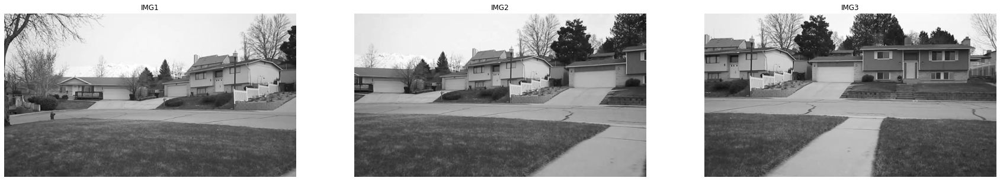

In [59]:
img1 = np.array(Image.open("img1.png"))
img2 = np.array(Image.open("img2.png"))
img3 = np.array(Image.open("img3.png"))

# Plotting all the images side by side
plotter(img1, img2, img3)

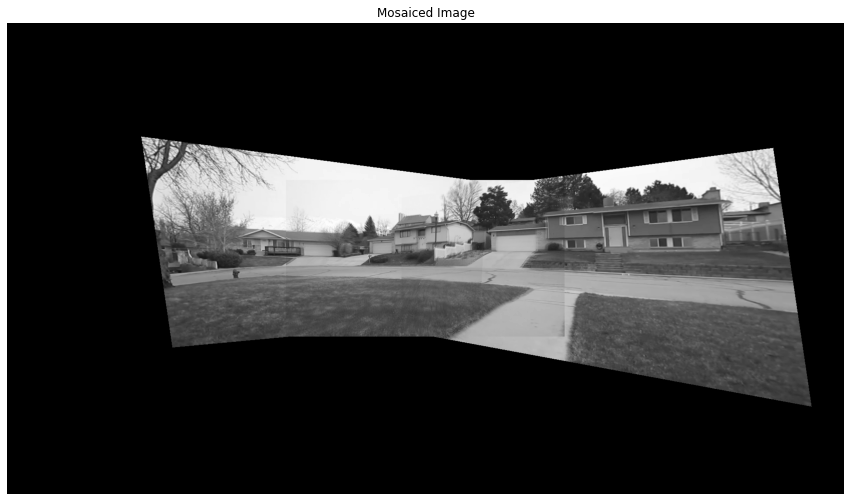

In [76]:
# Mosaicing the 3 images
final_img = mosaic3(img1, img2, img3)

# Plotting the mosaiced image
fig, ax = plt.subplots(1, 1, figsize=(15,15))
ax.imshow(final_img, cmap='gray')
ax.set_title("Mosaiced Image")
ax.axis('off')

plt.show()

In [72]:
save_cropped_mosaic(final_img ,"stitched_img.png")

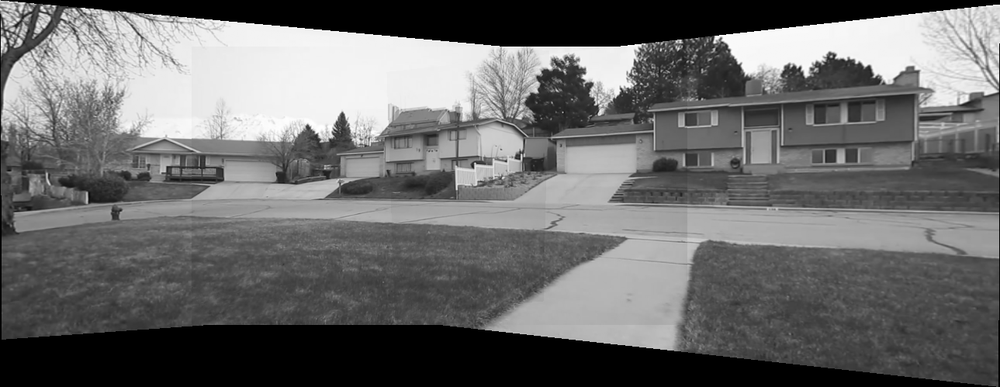

## Mosaic 2: Tank of 1974, IITM

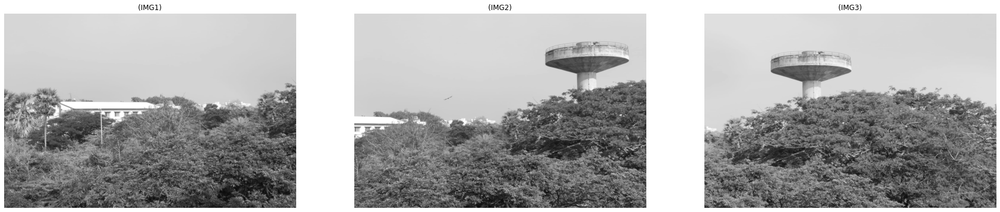

In [62]:
t1 = preprocess_img("selfimg1.jpg", (1500, 1000))
t2 = preprocess_img("selfimg2.jpg", (1500, 1000))
t3 = preprocess_img("selfimg3.jpg", (1500, 1000))

plotter(t1, t2, t3)

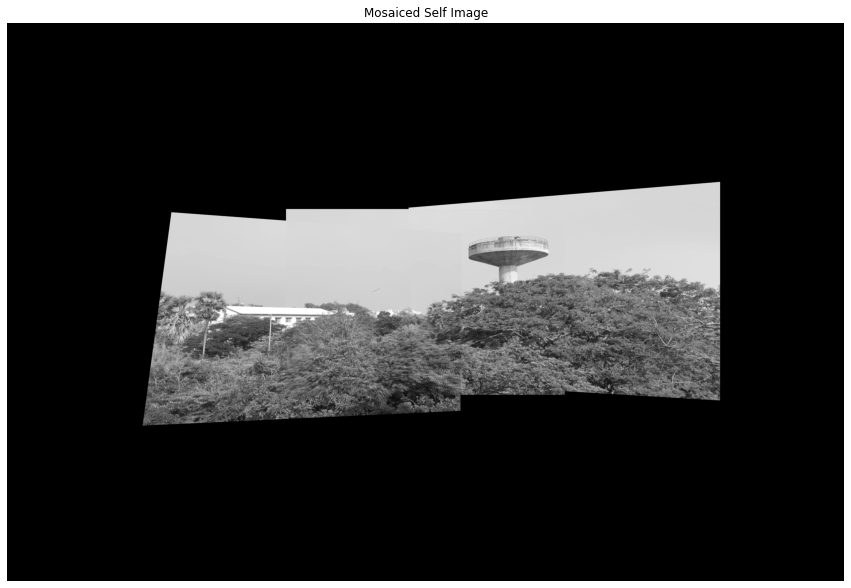

In [63]:
# Mosaicing the 3 images
final_selfimg = mosaic3(t1, t2, t3)

# Plotting the mosaiced image
fig, ax = plt.subplots(1, 1, figsize=(15,15))
ax.imshow(final_selfimg, cmap='gray')
ax.set_title("Mosaiced Self Image")
ax.axis('off')

plt.show()

In [74]:
save_cropped_mosaic(final_selfimg ,"stitched_selfimg.png")

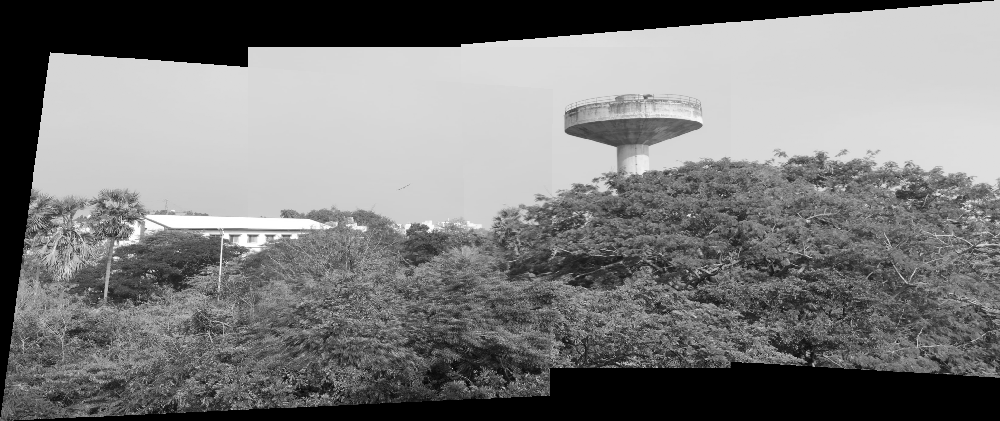

## Mosaic 3: Texas!
(Picture Credits: My sister!)

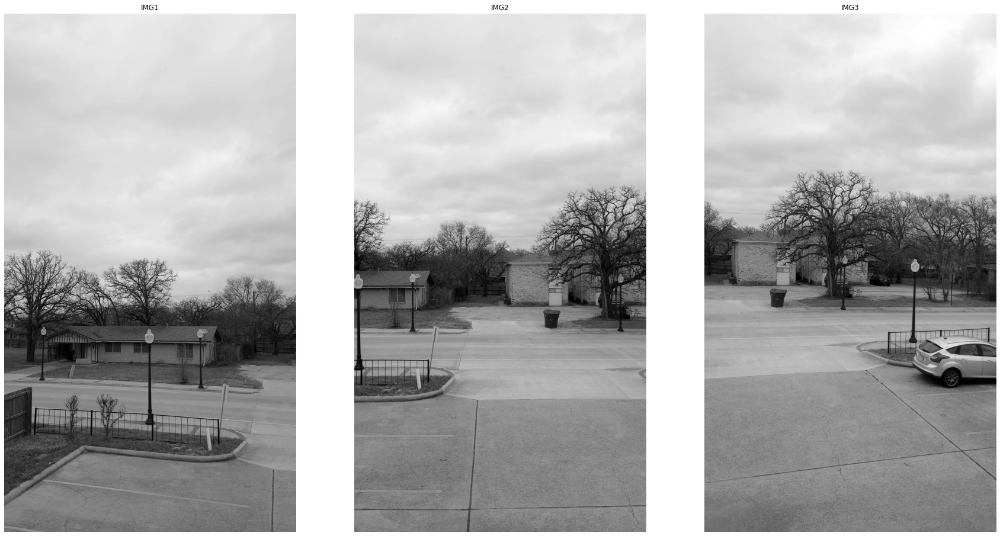

In [65]:
i1 = np.array(Image.open("image1.jpg").convert('L'))
i2 = np.array(Image.open("image2.jpg").convert('L'))
i3 = np.array(Image.open("image3.jpg").convert('L'))

# Plotting all the images side by side
plotter(i1, i2, i3)

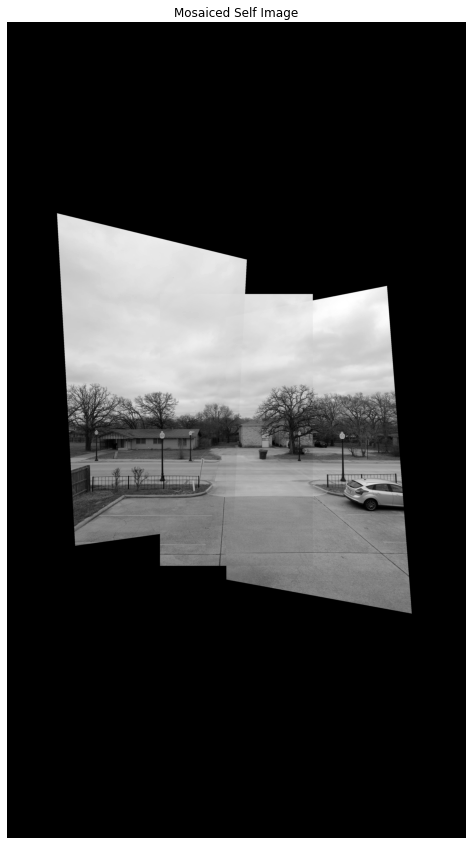

In [66]:
# Mosaicing the 3 images
final_image = mosaic3(i1, i2, i3)

# Plotting the mosaiced image
fig, ax = plt.subplots(1, 1, figsize=(15,15))
ax.imshow(final_image, cmap='gray')
ax.set_title("Mosaiced Self Image")
ax.axis('off')

plt.show()

In [67]:
save_cropped_mosaic(final_image ,"stitched_i.png")

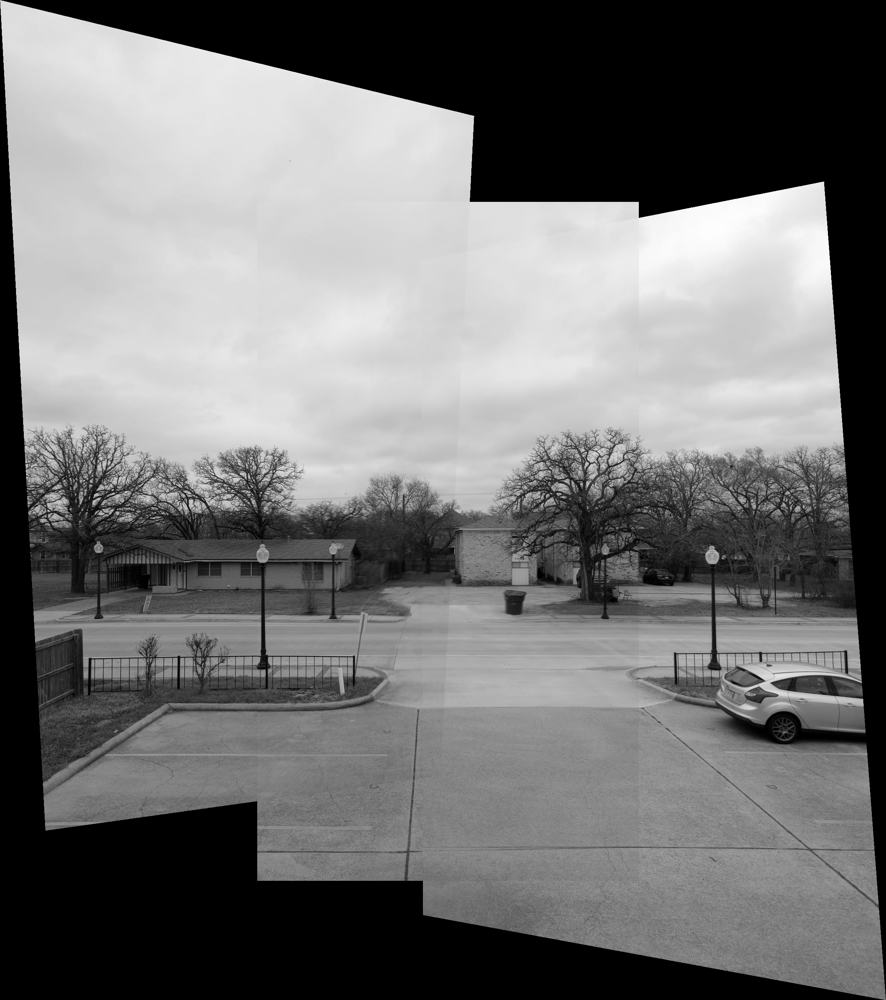

## Mosaic 4: Texas A&M Campus
(Picture Credits: My sister!)

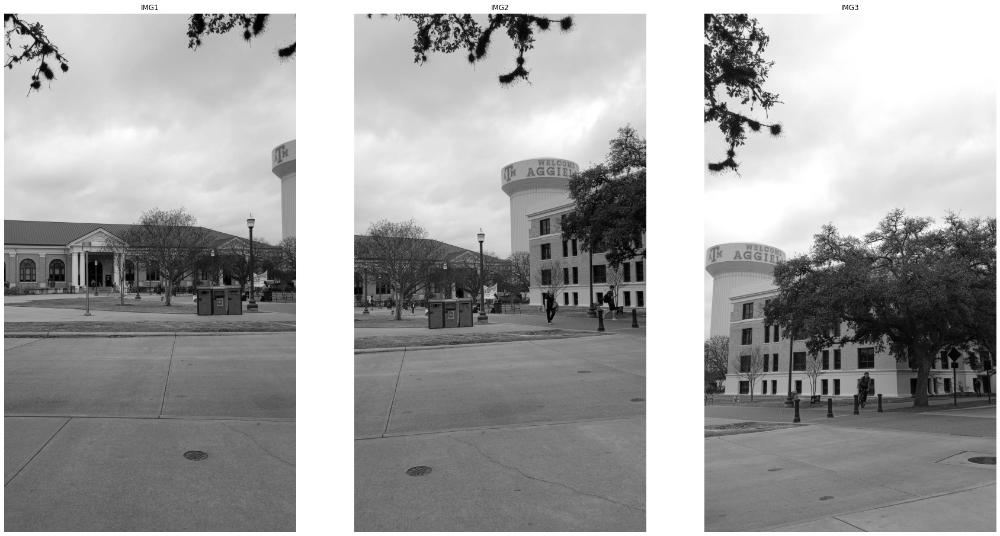

In [68]:
p1 = np.array(Image.open("p1.jpg").convert('L'))
p2 = np.array(Image.open("p2.jpg").convert('L'))
p3 = np.array(Image.open("p3.jpg").convert('L'))

# Plotting all the images side by side
plotter(p1, p2, p3)

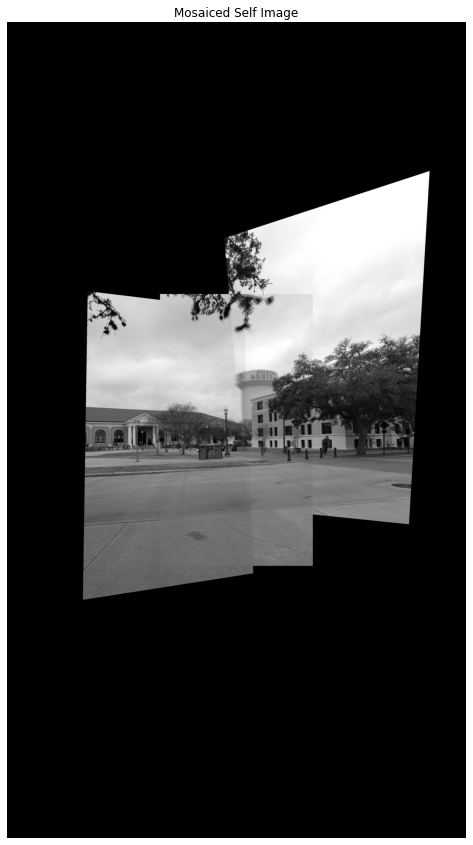

In [69]:
# Mosaicing the 3 images
final_pimage = mosaic3(p1, p2, p3)

# Plotting the mosaiced image
fig, ax = plt.subplots(1, 1, figsize=(15,15))
ax.imshow(final_pimage, cmap='gray')
ax.set_title("Mosaiced Self Image")
ax.axis('off')

plt.show()

In [70]:
save_cropped_mosaic(final_pimage ,"stitched_b.png")

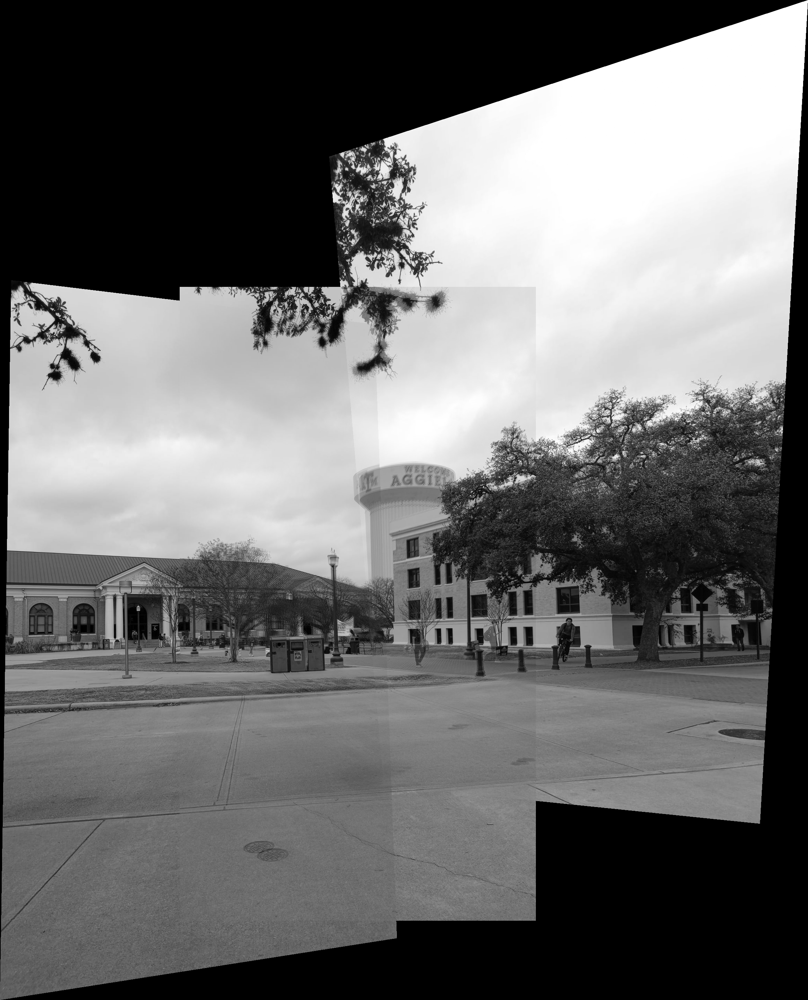

## Observations
1. The sift_correspondences(img1, img2) and sift_correspondences(img2, img1) give different results, But since we only end up using 4 point correspondences with RANSAC to handle outliers, we can safely ignore this phenomenon.
2. Since we are stitching 3 images together, I picked a target canvas of size 3 times the original images. But this turned out to be much larger than required and hence I implemented a cropping and saving function as well.
3. The function mosaic3() has a couple of drawbacks:
     - The middle image must be fed in as the img2 parameter to get the expected results
     - The double for loop to fill up the target canvas is very slow for high resolution images and must be vectorized
     - Note: The function can be easily edited to stitch more number of images together 
4. The first 3 images are of far-away scenes and the stitched output looks great. In the last image however, there is a tree branch in  the top part of the picture, which is very nearby compared to the building, which leads to some issues in the mosaiced image, due to parallax.